# Notebook demonstrating functionality of ensemble_stats package

## Overview

This package consists of three python scripts:

## 1. Statistical analysis and preprocessing utilities (analysis.py)

Contains utilities for preprocessing hierarchical ensemble timeseries, estimating persistence timescales, 
performing sliding-window, moving-block bootstrap (MBB) uncertainty analysis over time, and decomposing variance structure.

Functions include:

[optional pre-processing step]

- `compute_STL_decomposition`
  Compute the Seasonal Decomposition of Time Series by Loess (STL) (Thanks to Ashwin Seshadri for highlighting this method.)

  Cleveland, R., Cleveland, W., McRae, J., & Terpenninng, I. (1990). STL: A Seasonal-Trend Decomposition Procedure Based on Loess. Journal of Official Statistics, 6(1), 3–73.

  (This works well with stationary and non-stationary timeseries. For a simpler version of the above, but only for stationary timeseries, use:)

- `remove_linear_trend`  
  Remove a prescribed linear temporal trend.

- `remove_seasonal_cycle`  
  Remove the mean monthly seasonal cycle.

[main analysis step]

- `validate_input_dims`  
  Validate required ensemble and temporal dimensions.

- `estimate_autocorrelation_timescale`  
  Estimate persistence timescale from autocorrelation decay.

- `estimate_mutual_information_timescale`  
  Estimate nonlinear persistence timescale from delayed mutual information.

- `define_block_length`  
  Determine an appropriate MBB block length from ensemble persistence statistics.

- `moving_block_bootstrap_indices`  
  Generate moving-block bootstrap resampling indices.

- `compute_block_statistics_anova`  
  Perform hierarchical ANOVA-style variance decomposition.

- `sliding_window_MBB_ensemble_analysis`  
  Apply sliding-window ensemble analysis with optional moving-block bootstrap uncertainty estimation.

[Diagnostic functions]

- `compute_relative_nonstationarity`  
  Quantify normalized temporal variability of a variance series.

- `compute_preprocessing_variance_statistics`  
  Compare ensemble variance statistics before and after preprocessing.


```mermaid
flowchart TD

    G["sliding_window_MBB_ensemble_analysis()"]

    %% Top-level validation
    G --> A["validate_input_dims()"]

    %% Main statistics pathway
    G --> F["compute_block_statistics_anova()"]

    %% Bootstrap pathway
    G --> E["moving_block_bootstrap_indices()"]
    E --> RNG["numpy.random.Generator"]

    %% Optional preprocessing dependency
    G -.uses externally supplied.-> D["define_block_length()"]

    %% Block-length estimation hierarchy
    D --> B["estimate_autocorrelation_timescale()"]
    D --> C["estimate_mutual_information_timescale()"]

    %% External library dependencies
    B --> ACF["statsmodels.tsa.stattools.acf"]

    C --> MI["sklearn.feature_selection.mutual_info_regression"]

    %% Internal loop structure annotations
    subgraph "Sliding Window Loop"
        G
        F
        E
    end

    subgraph "Persistence Estimation Subsystem"
        D
        B
        C
    end
```


## 2. Visualisation utilities (plotting.py)

Contains plotting utilities for diagnosing hierarchical ensemble structure, preprocessing effects, variance decomposition, and bootstrap uncertainty.

Functions include:

- `plot_STL_decomposition`

  Plot STL decomposition components of the grand ensemble-mean timeseries.  Seasonal Decomposition of Time Series by Loess (STL).
  
- `plot_groups_members`  
  Visualize nested ensemble members and highlighted realizations.

- `plot_preprocessing_components`  
  Compare original, detrended, and preprocessed signals.

- `plot_normalised_variance`  
  Compare normalized ensemble variance before and after preprocessing.

- `plot_distribution_comparison`  
  Compare empirical distributions of original and preprocessed data.

- `plot_variance_decomposition_timeseries`  
  Plot temporal evolution of variance decomposition components.

- `plot_fractional_variance_decomposition`  
  Plot fractional contributions of variance components.

- `plot_fraction_predictable_variance_bootstrap`  
  Plot macro-state fraction of predictable variance with bootstrap percentile envelopes.

- `plot_temporal_variance_components_bootstrap`  
  Plot grand-ensemble or selected macro-state temporal variance components with bootstrap percentile envelopes.

- `plot_bootstrap_confidence_intervals`  
  Visualize bootstrap confidence intervals for selected statistics.

- `plot_member_spaghetti`  
  Display all ensemble realizations and ensemble mean.

- `plot_example_window_decomposition`  
  Inspect mean structure within a selected sliding window.

## 3. Synthetic hierarchical ensemble generator (synthetic.py)

Contains utilities for generating synthetic hierarchical ensemble timeseries with nested group/member structure and temporally correlated variability.
This can be used for testing (1) and (2), as a tunable dataset in place of actual climate model data.

Functions include:

- `generate_synthetic_nested_ensemble`  
  Generate a synthetic `(j, k, t)` ensemble field containing:
  
  - shared grand signal
  - seasonal variability
  - linear trend
  - AR(2) red-noise persistence
  - group-dependent variability
  - member-dependent variability
  - stochastic residual noise

The generated dataset mimics hierarchical ensemble systems such as:
- single-model large ensembles (SMILEs)
- multi-model ensembles
- nested macro/micro initial-condition ensembles

----

## Notes

In some studies, a user-defined linear trend (e.g. estimated model drift from a pre-industrial control simulation; Deser et al., 2025) and/or the mean seasonal cycle are removed before further statistical analysis. These preprocessing steps can substantially affect estimated statistics, although residual trends and evolving seasonality may still remain.

Characteristic persistence timescales are then estimated from the residual ensemble data using autocorrelation and mutual information measures. These are combined to define a moving-block bootstrap (MBB; Künsch, 1989) block length representing the dominant temporal memory scale.

The MBB framework is applied within a sliding analysis window across the hierarchical ensemble structure. Temporal blocks are repeatedly resampled to estimate statistics and their uncertainty under serial dependence.

Current analysis options include:

-ANOVA-style variance decomposition (Hodson and Sutton, 2008; Hawkins and Sutton, 2009; Deser et al., 2025)

A previous analysis option was developed to assess the statistics of the slope and intercept of an
ordinary least-squares trend estimation for Rapid Ice Loss Event diagnostics (Auclair and Tremblay, 2018; Sticker et al., 2025).
However, due to the persistence timescales for the SIE timeseries being very large (~ 145 years of a 150-year timeseries) when
minimally preprocessed (as in the AT18 and S25 papers), it was decided that their RILE definition is incompatible with this framework.
Therefore, the following two functions are included in analysis.py, but are commented out as a precaution.  These may be useful for some other application of trend analysis.

- compute_block_statistics_sliding_forwards_trend_params
- forward_sliding_trend_nan_robust



### Changelog for this notebook and accompanying ensemble_stats package:
 
 11 May 2026: v0.1.0 - Chris Wilson - first release version.
 
 14 May 2026: v0.1.1 - Chris Wilson - bugfixes and extra plots in this notebook.

 26 May 2026: v0.2 - Chris Wilson - bugfixes and tidying

 2 June 2026: v0.2.1 - CW - fixed bug in pyproject.toml, tidied environment.yml, tidied notebook.
 
*OpenAI ChatGPT was used to assist with aspects of code development and refinement.*

-------------------------------------------------------------

## Import the new package, "ensemble_stats", or one or more of its 3 component parts 

In [7]:

import ensemble_stats.synthetic as synthetic

import ensemble_stats.analysis as analysis

import ensemble_stats.plotting as plotting

# Gather data for analysis

## Choose ONE of the following options:  

## Either a) load the SIE data from Jake's directories

### CANARI LE SIE for historical (1950-2014) and future SSP3-7.0 scenario (2015-2099)

In [4]:
import xarray as xr
import numpy as np
import glob
import datetime
import cftime

# --- Load + concatenate in one go ---
def load_members(path_pattern):
    files = sorted(glob.glob(path_pattern), key=len)
    return xr.concat([xr.open_dataset(f) for f in files], dim="member")

ds_hist   = load_members('/home/users/jraylmer/share/canari/data/seaice/siextent/HIST2/*2014*nc')
ds_future = load_members('/home/users/jraylmer/share/canari/data/seaice/siextent/SSP370/*2099*nc')

# --- Combine time ---
ds = xr.concat([ds_hist, ds_future], dim="time")

da = ds["sie_n"]

# --- Assign group (vectorised, no intermediate variables needed) ---
da = da.assign_coords(group=da.member // 5)

# --- Reshape to (j, k, time) ---
da = (
    da.sortby("group")
      .assign_coords(
          k=("member", np.tile(np.arange(5), len(da.member)//5))
      )
      .set_index(member=["group", "k"])
      .unstack("member")
      .rename(group="j")
      .transpose("j", "k", "time")
)

## ... Or alternatively, b) read some other data to be analysed and convert it to an xarray DataArray, if necessary.

### The DataArray needs to have a minimum of 3 dimensions - group, "j", member, "k", and time, "t".  

### Here is a wrapper function for numpy to xarray conversion:

In [3]:
import cftime
import numpy as np
import xarray as xr


def numpy_to_xarray_ensemble_360day(
    data,
    start_year=1955,
    start_month=9,
    start_day=21,
    name="ensemble_data",
):

    data = np.asarray(data)

    if data.ndim != 3:
        raise ValueError(
            f"Expected 3D array (j, k, t), got shape {data.shape}"
        )

    nj, nk, nt = data.shape

    # Fixed 30-day spacing on a 360-day calendar
    time = xr.date_range(
        start=cftime.Datetime360Day(
            start_year,
            start_month,
            start_day,
        ),
        periods=nt,
        # To change the sampling frequency, edit the line below.  e.g. to "30D"
        freq="360D",   
        use_cftime=True,
    )

    return xr.DataArray(
        data,
        dims=["j", "k", "t"],
        coords={
            "j": np.arange(nj),
            "k": np.arange(nk),
            "t": time,
        },
        name=name,
    )

### b) (cont.) ...and here is an example of how to use it:

In [ ]:
import numpy as np

# ----------------------------------------------------------
# Example NumPy array:
# shape = (j, k, t)
# ----------------------------------------------------------

data = np.random.normal(size=(8, 5, 1800))

# Create DataArray matching real-data structure
da = (
    numpy_to_xarray_ensemble_360day(
        data,
        start_year=1955,
        start_month=9,
        start_day=21,
        name="sie_n",
    )
    .rename(t="time")
    .transpose("j", "k", "time")
)

#print(da.time.values[:5])

### .... Or alternatively, c) generate some synthetic ensemble data:

In [ ]:
# Generates a synthetic hierarchical ensemble dataset with dimensions `(j, k, time)`,
# containing a shared forced signal, group variability, member variability,
# and optional residual noise.  Key inputs control ensemble size, temporal
# trend/seasonality, persistence strength, and variability amplitudes.
# Returns an `xarray.DataArray` suitable for testing ANOVA and bootstrap workflows.

# (This calls the function `generate_synthetic_nested_ensemble`, which is still very rough and needs further tidying!)
    
nt_synthetic=1800 # time samples (e.g. monthly means.)
gintercept=0.0 # user-prescribed coefficients of a linear trend
gslope=0.01 # ... for model drift - taken from pre-industrial control (but synthesised here.)
gseasonal_amp=1.2 # amplitude of the seasonal cycle in the synthetic data.
gAR2_scale=0.5 # amplitude of an AR(2) timeseries [needs other parameters adding here and describing]

nj=8 # number of parent groups in the ensemble (e.g. macro initial condition states)
nk=5 # number of ensemble members within each group (assumed to be micro I.C. perturbations to the background group)
R_jt_scale = 0.5 #time-varying group scale factor
R_jkt_scale = 1.0 #time-varying member offset and scale factor
residual_scale=0.03 #noise scale factor

random_seed=123 # This can be "None", but setting a particular integer allows reproducibility 

da = synthetic.generate_synthetic_nested_ensemble(
    nt=nt_synthetic,
    gintercept=gintercept,
    gslope=gslope,
    gseasonal_amp=gseasonal_amp,
    gAR2_scale=gAR2_scale,
    nj=nj,
    nk=nk,
    R_jt_scale = R_jt_scale, 
    R_jkt_scale = R_jkt_scale,
    residual_scale=residual_scale,
    start_date="1950-01-21",
    seed=123,
    t_dim="time",
    variable_name="sie_n",
)

#print(da)

### Metadata for plot labels

The plotting helpers read variable metadata when labelling axes, titles, and units. This cell keeps the worked example labelled as SIE; for a different dataset, change `variable_label` and `units` below before running the analysis.

In [ ]:
plot_metadata = plotting.PlotMetadata(
    variable_label="SIE",
    units=r"$10^6$ km$^2$",
    time_label="Year",
    group_label="j",
    member_label="k",
)

da = da.assign_attrs(
    long_name=plot_metadata.variable_label,
    units=plot_metadata.units,
)

# Prepare and check the input data

## PRE-PROCESSING STEP : tailor this to the particular analysis

### Seasonal Decomposition of Time Series by Loess (STL) on the timeseries of the grand ensemble-mean.
(Suggested by Ashwin Seshadri:)

Cleveland, R., Cleveland, W., McRae, J., & Terpenninng, I. (1990). STL: A Seasonal-Trend Decomposition Procedure Based on Loess. Journal of Official Statistics, 6(1), 3–73.


In [5]:
# This is the 1D timeseries from which the trend and seasonal 
# components are defined using STL.

g_jk_mean_STL_ds = analysis.compute_STL_decomposition(da)

trend = g_jk_mean_STL_ds.STL_trend
seasonal = g_jk_mean_STL_ds.STL_seasonal
residual = g_jk_mean_STL_ds.STL_resid

## Plot the STL components of the timeseries of the grand ensemble-mean

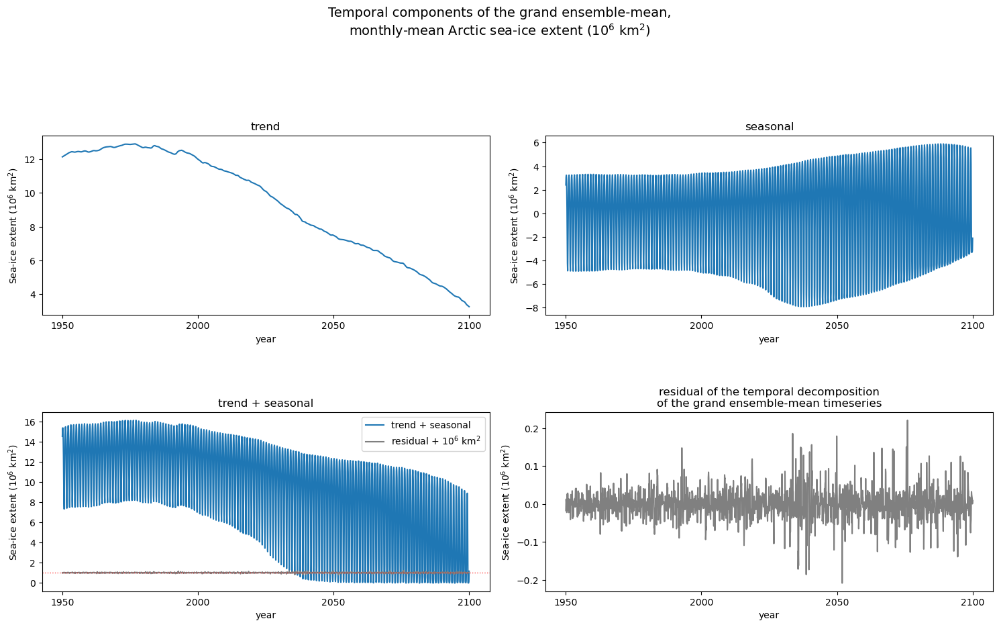

In [6]:
fig, axes = plotting.plot_STL_decomposition(
    g_jk_mean_STL_ds,
    metadata=plot_metadata,
    residual_overlay_offset=1.0,
)

plotting.plt.show()

# Prepare the (j, k, time) data for sliding window, moving-block bootstrap (SWMBB) analysis 

## In this example, from each of the 40 members we subtract: 

## the trend and 
## seasonal cycle 

which have been fit to the grand-ensemble mean timeseries using the STL method, described above.

In [7]:
g_original = da
g_detrended = da - trend
g_residual = g_original - trend - seasonal

g_preprocessed = g_residual

for _field in (g_original, g_detrended, g_residual, g_preprocessed):
    _field.attrs.update(da.attrs)

## Illustration of the contributions of the individual members to the grey line in the previous plot

<function matplotlib.pyplot.show(close=None, block=None)>

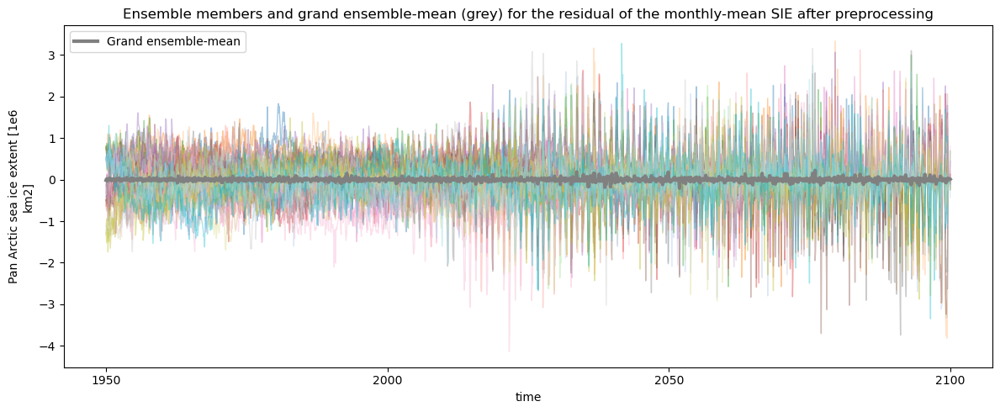

In [14]:
import matplotlib.pyplot as plt
fig, ax = plotting.plot_member_spaghetti(
    g_preprocessed,
    metadata=plot_metadata,
    title="Ensemble members and grand ensemble-mean (grey) for the residual of the monthly-mean SIE after preprocessing",
)
plt.show

### Plot a segment of the timeseries, showing the hierarchical structure for groups, j, and members, k.
### Select a parent group and child member for emphasis. 

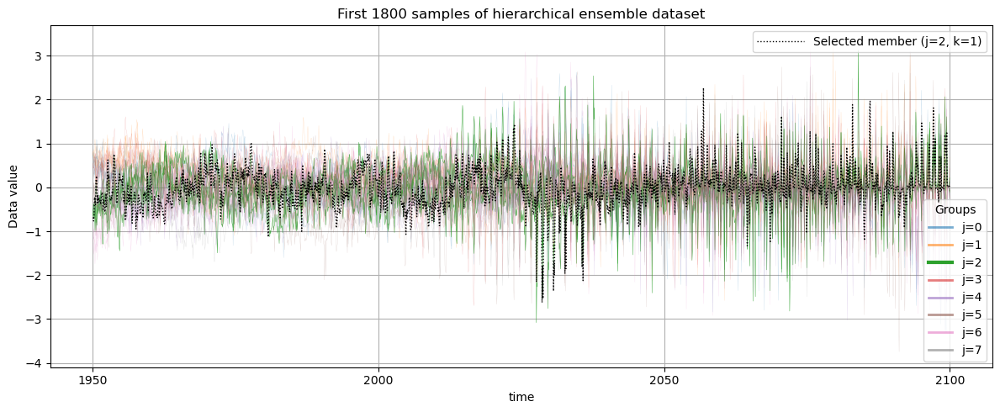

In [15]:

fig, ax = plotting.plot_groups_members(g_residual,
    ntimes=1800,
    jsel=2,
    ksel=1,
    j_dim="j",
    k_dim="k",
    t_dim="time",
    metadata=plot_metadata,
)

plt.show()

## Compare across-ensemble variability and distribution, before and after preprocessing

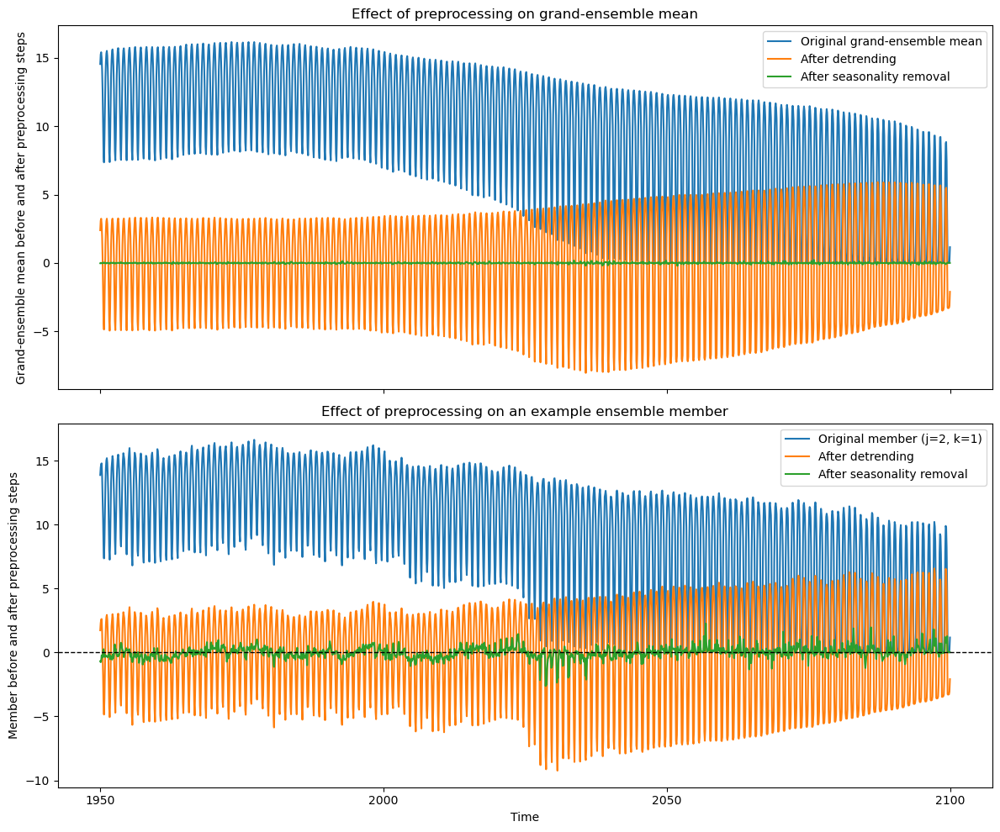

In [16]:
fig, ax = plotting.plot_preprocessing_components(
    g_original,
    g_detrended,
    g_residual,
    j_example=2,
    k_example=1,
    j_dim="j",
    k_dim="k",
    t_dim="time",
    metadata=plot_metadata,
)

### Examine the effect of preprocessing on the PDF of the grand ensemble-mean

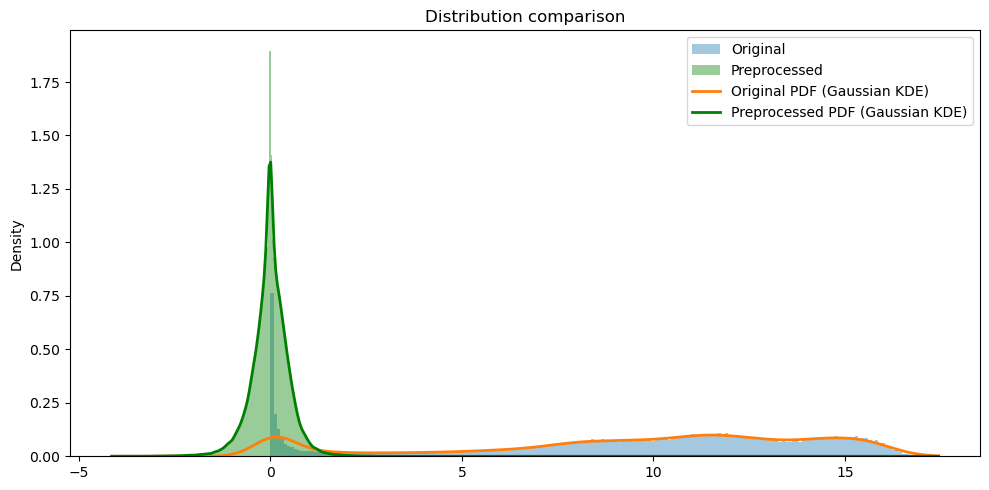

In [17]:
results = analysis.compute_preprocessing_variance_statistics(
    g_original,
    g_residual,
    j_dim="j",
    k_dim="k")

normalised_variance_original = results["ensemble_variance_original_norm"]
normalised_variance_residual = results["ensemble_variance_residual_norm"]


fig, ax = plotting.plot_distribution_comparison(
    g_original,
    g_residual,
    bins=200,
    metadata=plot_metadata,
)

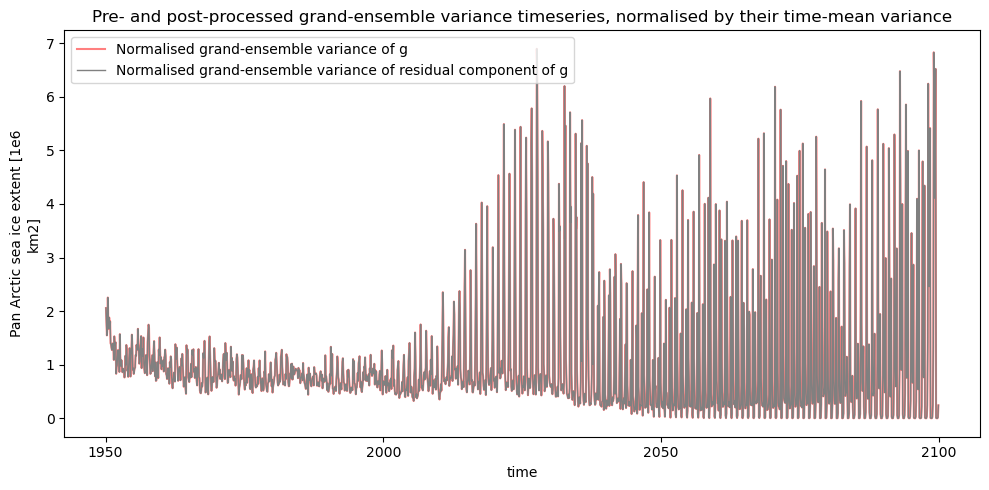

In [18]:
fig,ax = plotting.plot_normalised_variance(
    normalised_variance_original,
    normalised_variance_residual,
    t_dim="time",
    metadata=plot_metadata,
)

# Calculate the sliding-window moving-block bootstrap analysis of variance over time, for the hierarchical ensemble structure 

### Estimate a suitable moving-block length (this can take a few minutes to calculate)

In [20]:
timescale_info = analysis.define_block_length(
    g_preprocessed,
    j_dim="j",
    k_dim="k",
    t_dim="time",
    persistence_factor=4, #usually choose a value between 3 and 5
    quantile=0.75,
)

block_length = timescale_info["block_length"]

print("Recommended block length:", block_length)
print(timescale_info)

Recommended block length: 60
{'acf_timescales': array([ 8, 14,  5,  9,  3,  8,  5,  4,  3,  3,  4,  3,  2, 15,  3, 31,  3,
        5,  3, 18, 14,  4,  6,  3, 14,  3, 52, 17,  3,  5, 17, 19, 18,  6,
        3, 15, 15,  6,  3,  3]), 'mi_timescales': array([ 3,  3,  4,  3,  3,  3,  4,  4,  3,  3,  3,  3,  3,  5,  3,  3,  3,
        4,  4, 14,  4,  4,  3,  3,  4,  3, 20, 14,  3,  3,  8,  6,  4,  3,
        3,  4,  5,  3,  3,  3]), 'representative_acf': 15, 'representative_mi': 4, 'dominant_persistence_scale': 15, 'block_length': 60}


### Compute statistics decomposition for one example block (e.g. statistics=ANOVA)

    Compute analysis of variance (ANOVA) decomposition statistics for a block.
    
    Motivated by: 
    Hodson, D. L. R. and R. T. Sutton (2008). doi: 10.1007/s00382-008-0372-z
    Hawkins, E. and R. T. Sutton (2009). doi: 10.1175/2009BAMS2607.1
    Deser, C. et al. (2025). doi: 10.1007/s00382-024-07553-z
    
    The decomposition separates the signal into:
    - mu = time-mean of grand ensemble-mean
    - alpha = time variation of grand ensemble-mean w.r.t. mu
    - beta = group bias w.r.t. mu
    - gamma = time variation of unbiased group-mean
    - epsilon = internal variability

    If the input data has been preprocessed, e.g. using STL to remove trend and seasonal
    components, it is common to use that residual as the input, i.e.  
    
$$
g_{residual}=g_{original}-g_{trend}-g_{seasonal}
$$.

Then we subsample in time to define a block, $g_{block}(j,k,t)\subset g_{residual}(j,k,t)$, which is decomposed as:

$$
g_{block}(j,k,t)=\mu+\alpha(t)+\beta(j)+\gamma(j,t)+\epsilon(j,k,t),
$$ 
where the terms on the right-hand side are defined as means over various indices, denoted by superscripts of $\overline{g_{block}(j,k,t)}$, in the following:


$$
g_{block}(j,k,t)=\overbrace{\overline{g_{block}}^{j,k,t}}^{\mu=\text{time-mean of grand ensemble-mean}}+
\overbrace{\overline{g_{block}}^{j,k}(t)-\mu}^{\alpha=\text{time variation of grand ensemble-mean w.r.t.}\mu}+\overbrace{\overline{g_{block}}^{k,t}(j)-\mu}^{\beta=\text{group bias w.r.t.} \mu}+\overbrace{\overline{g_{block}}^{k|j}(j,t)-\mu-\alpha-\beta}^{\gamma=\text{time variation of unbiased group-mean}}+\overbrace{\epsilon(j,k,t)}^{\epsilon=\text{internal variability}}.
$$
    Note that each member has a timeseries that can be expressed as the above decomposition, but also that
    if we want to consider the components of *temporal* variance, only three terms contribute to the total *temporal* variance
    *of the input data $\equiv$ preprocessed or residual* (remember that any trend or seasonal components removed in preprocessing also contribute to temporal variability of the 'original' timeseries, so this ANOVA only applies to the residual):

$\sigma^2_{total}(j,k) = \sigma^2_\alpha + \sigma^2_\gamma (j) + \sigma^2_\epsilon (j,k)$

    

In [21]:
# Convert to NumPy array for use with function 'compute_block_statistics_anova_numpy'
# which is NumPy-native for better computational performance

g_block = (
    g_preprocessed
    .isel(time=slice(0, block_length))
    .transpose("j", "k", "time")
    .values
)

stats = analysis.compute_block_statistics_anova_numpy(g_block)

#print(stats)

### Check the closure for this example block (single time segment) for each of the members

In [22]:
for j in range(8):
    for k in range(5):

        closure_error = (
            stats["alpha_time_var"]
            + stats["gamma_time_var"][j]
            + stats["epsilon_time_var"][j, k]
            - stats["total_time_var"][j, k]
        )

        max_abs_error = float(
            np.abs(closure_error).max()
        )

        print(
            f"(j={j}, k={k}) : "
            f"max |closure error| = "
            f"{max_abs_error:.6e}"
        )

(j=0, k=0) : max |closure error| = 1.078997e-03
(j=0, k=1) : max |closure error| = 1.472492e-02
(j=0, k=2) : max |closure error| = 1.295806e-02
(j=0, k=3) : max |closure error| = 1.560757e-02
(j=0, k=4) : max |closure error| = 1.046769e-02
(j=1, k=0) : max |closure error| = 7.626728e-03
(j=1, k=1) : max |closure error| = 1.766671e-03
(j=1, k=2) : max |closure error| = 5.881553e-03
(j=1, k=3) : max |closure error| = 8.528328e-03
(j=1, k=4) : max |closure error| = 6.903521e-03
(j=2, k=0) : max |closure error| = 2.702066e-02
(j=2, k=1) : max |closure error| = 3.313892e-02
(j=2, k=2) : max |closure error| = 4.252229e-02
(j=2, k=3) : max |closure error| = 1.508047e-02
(j=2, k=4) : max |closure error| = 2.657231e-02
(j=3, k=0) : max |closure error| = 1.947190e-02
(j=3, k=1) : max |closure error| = 1.377650e-02
(j=3, k=2) : max |closure error| = 4.828421e-04
(j=3, k=3) : max |closure error| = 1.304428e-02
(j=3, k=4) : max |closure error| = 1.131616e-02
(j=4, k=0) : max |closure error| = 1.307

### .... and globally, across all members (this should equal zero to machine precision)

In [23]:
closure_error_global = (
    stats["alpha_time_var"]
    + np.mean(stats["gamma_time_var"], axis=0)
    + np.mean(stats["epsilon_time_var"], axis=(0, 1))
    - np.mean(stats["total_time_var"], axis=(0, 1))
)

print(float(np.abs(closure_error_global).max()))


1.3877787807814457e-17


## Now we can compute the sliding window, moving-block bootstrap ensemble analysis of statistics (here, statistics=ANOVA) - this takes a couple of minutes for the example : window_length=121 and n_boot=200.

In [26]:
# Choice of length of the sliding window is important!
#   - if it is too short, there will not be many independent overlapping bootstrap blocks available
#     (if the window width is w and the block length is b, there are w-b+1.)
#   - if it is too long, then high-frequency dynamical information could be lost to smoothing.
#   - the data sampling period and the overall length of the full timeseries affect this choice too.

# The block_length was estimated by the earlier call of define_block_length
# and the sliding window_length is defined here.  window_length must be > block_length and should be an odd integer.

window_length = 121 # This is approx. 10 years for monthly data.

results = analysis.sliding_window_MBB_ensemble_analysis(
    g_preprocessed,    
    j_dim="j",
    k_dim="k",
    t_dim="time",
    window_length=window_length,
    bootstrap=True,
    n_boot=20, #use 200 or larger for production calculation!
    block_length=block_length,
    random_seed=123,
    store_bootstrap_samples=True # currently, if set to true, there's an imposed limit of n_boot=20, to avoid excessive RAM usage and kernel instability.  
    )

print(results)


<xarray.Dataset> Size: 1GB
Dimensions:                     (time: 1680, window_time: 121, j: 8, k: 5,
                                 boot: 20)
Coordinates:
  * time                        (time) object 13kB 1955-01-21 00:00:00 ... 20...
  * window_time                 (window_time) int64 968B 0 1 2 3 ... 118 119 120
  * j                           (j) int64 64B 0 1 2 3 4 5 6 7
  * k                           (k) int64 40B 0 1 2 3 4
  * boot                        (boot) int64 160B 0 1 2 3 4 5 ... 15 16 17 18 19
Data variables: (12/64)
    mu                          (time) float64 13kB 0.000163 ... 0.001049
    alpha                       (time, window_time) float64 2MB -0.0166 ... 0...
    beta                        (time, j) float64 108kB 0.2217 ... 0.02955
    gamma                       (time, j, window_time) float64 13MB 0.5492 .....
    epsilon                     (time, j, k, window_time) float64 65MB -0.030...
    alpha_time_mean             (time) float64 13kB -5.305e-19 ..

# Plot some results....

## Q1. Are there times when memory of macro initial conditions (i.e. associated with parent group, with index j) can be attributed to a potentially predictable change?

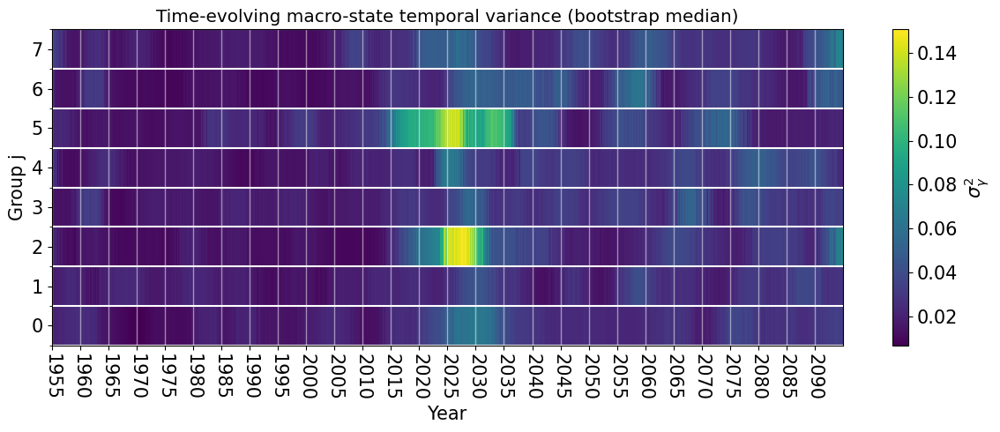

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------
# Bootstrap ensemble
# Dimensions:
# (boot, j, time)
# ------------------------------------------------------
boot = (
    results["gamma_time_var_boot"]
    .transpose("boot", "j", "time")
)

# ------------------------------------------------------
# Median across bootstrap dimension
# Result dims:
# (j, time)
# ------------------------------------------------------
p50 = boot.quantile(0.5, dim="boot")

# ----------------------------------------------------------
# Font scaling
# ----------------------------------------------------------
base_tick_size = 10
base_colorbar_size = 10
base_title_size = 12

tick_size = base_tick_size * 1.5
colorbar_size = base_colorbar_size * 1.5
title_size = base_title_size * 1.2

# ------------------------------------------------------
# Figure
# ------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 5))

# ------------------------------------------------------
# Plot
# ------------------------------------------------------
im = p50.plot(
    ax=ax,
    cmap="viridis",
    cbar_kwargs={
        "label": r"$\sigma_\gamma^2$",
    },
)

# ------------------------------------------------------
# Colorbar formatting
# ------------------------------------------------------
cbar = im.colorbar

cbar.ax.tick_params(
    labelsize=colorbar_size
)

cbar.set_label(
    r"$\sigma_\gamma^2$",
    fontsize=colorbar_size,
)

# ------------------------------------------------------
# Labels/titles
# ------------------------------------------------------
ax.set_ylabel(
    "Group j",
    fontsize=tick_size,
)

ax.set_xlabel(
    "Year",
    fontsize=tick_size,
)

ax.set_title(
    "Time-evolving macro-state temporal variance "
    "(bootstrap median)",
    fontsize=title_size,
)

# ------------------------------------------------------
# Tick every 5 years (= 60 monthly samples)
# ------------------------------------------------------
tick_idx = np.arange(0, len(results["time"]), 60)

tick_times = results["time"].values[tick_idx]

# Major ticks
ax.set_xticks(tick_times)

# Labels
ax.set_xticklabels(
    [f"{t.year:04d}" for t in tick_times],
    rotation=-90,
    ha='center',
)

# ----------------------------------------------------------
# Tick formatting
# ----------------------------------------------------------
ax.tick_params(
    axis='both',
    labelsize=tick_size,
)

# ------------------------------------------------------
# Y-grid at cell edges
# ------------------------------------------------------
j_vals = results["j"].values

y_edges = np.arange(
    j_vals.min() - 0.5,
    j_vals.max() + 1.5,
    1
)

ax.set_yticks(j_vals)               # centres
ax.set_yticks(y_edges, minor=True) # edges

# ------------------------------------------------------
# Grid configuration
# ------------------------------------------------------
# X-grid at cell centres
ax.grid(
    which='major',
    axis='x',
    color='white',
    linewidth=1.0,
    alpha=0.5,
)

# Y-grid at cell edges
ax.grid(
    which='minor',
    axis='y',
    color='white',
    linewidth=1.5,
)

# ------------------------------------------------------
# Tight axis/layout
# ------------------------------------------------------
ax.axis('tight')

plt.tight_layout()

# ----------------------------------------------------------
# Save figure
# ----------------------------------------------------------
fig.savefig(
    "CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_variance_per_macro_group_median_SWMBB.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

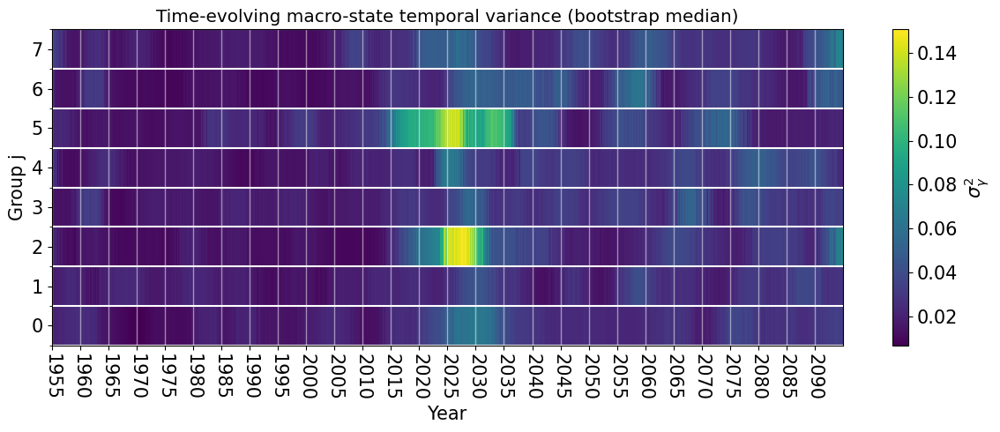

In [33]:
fig, ax = plotting.plot_gamma_time_var_bootstrap_median(
    results,
    metadata=plot_metadata,
)

In [34]:
# ----------------------------------------------------------
# Save figure
# ----------------------------------------------------------
fig.savefig(
    "CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_variance_per_macro_group_median_SWMBB.png",
    dpi=300,
    bbox_inches="tight",
)

## That's the median estimate from the SWMBB analysis.  Now examine the distribution at each time.

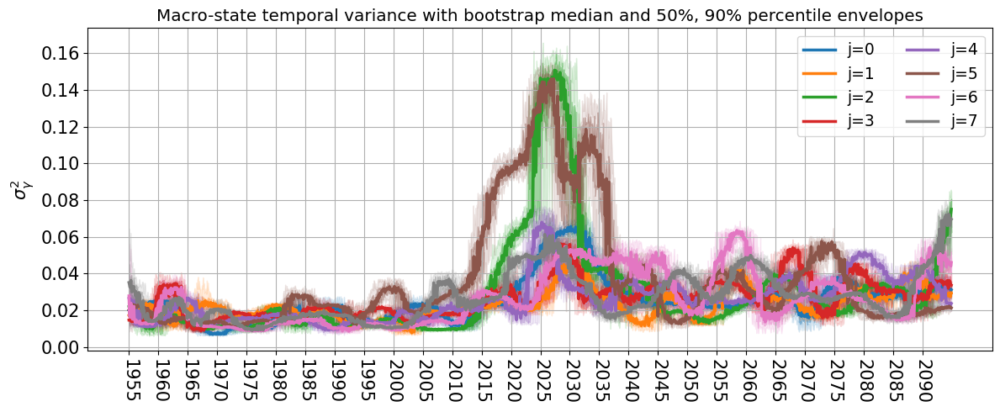

In [36]:
fig, ax = plotting.plot_gamma_time_var_bootstrap_envelopes(
    results,
    metadata=plot_metadata,
)

In [37]:
# ----------------------------------------------------------
# Save figure
# ----------------------------------------------------------
fig.savefig(
    "CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_variance_per_macro_group_SWMBB.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Plot the central estimate of each group (j= macro-state) component of signal to noise ratio, $\sigma_\gamma^2/\sigma_\epsilon^2$, based on temporal variance over the sliding window
### with confidence intervals on the SNR being estimated by propagating the (nonlinear) ratio of variance through the SWMBB.

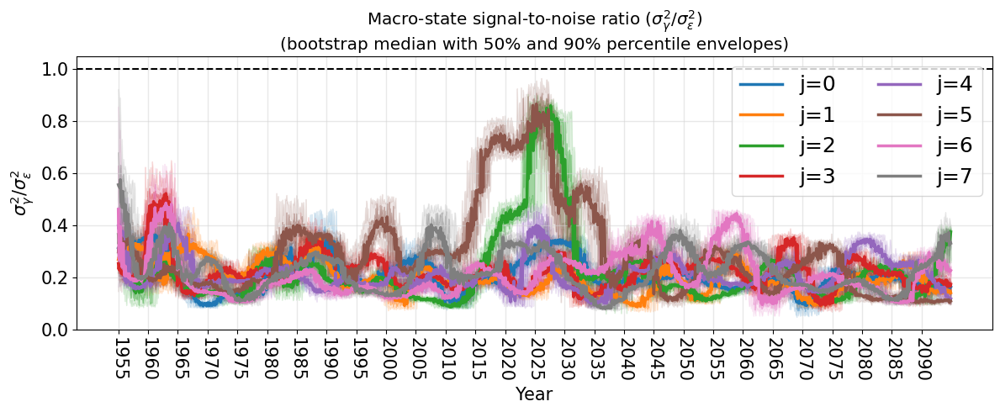

In [38]:
fig, ax = plotting.plot_gamma_to_epsilon_snr_bootstrap(
    results,
    metadata=plot_metadata,
)

In [39]:
# ----------------------------------------------------------
# Save figure
# ----------------------------------------------------------
fig.savefig(
    "CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_SNR_per_macro_group_SWMBB.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Plot selected macro groups (here, j=2 and j=5) 

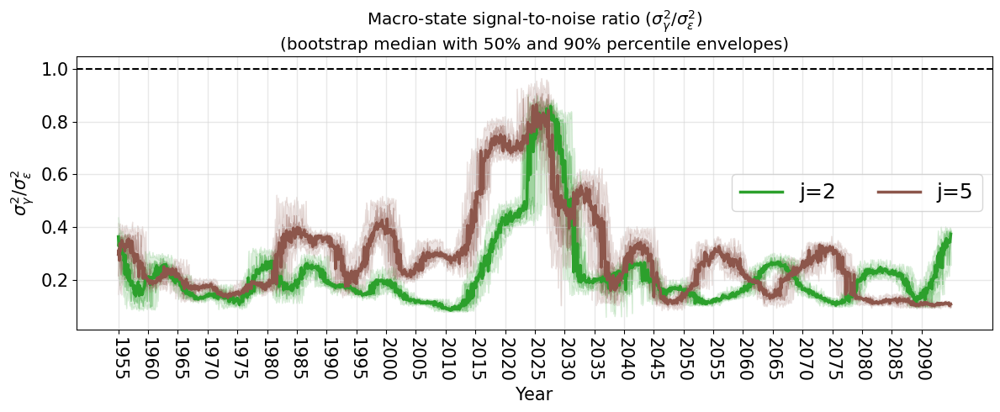

In [41]:
fig, ax = plotting.plot_gamma_to_epsilon_snr_bootstrap_subset(
    results,
    j_subset=[2, 5],
    metadata=plot_metadata,
)
plt.show()

In [42]:
# ----------------------------------------------------------
# Save figure
# ----------------------------------------------------------
fig.savefig(
    "CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_SNR_per_macro_group_j2j5_only_SWMBB.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Plot the central estimate of each group (j= macro-state) component of fraction of predictable variance, $(\sigma_\alpha^2+\sigma_\gamma^2)/\sigma_{total}^2$, based on temporal variance over the sliding window
### with confidence intervals on the FPV being estimated by propagating the (nonlinear) ratio of variance through the MBB.  N.B. $\sigma_{total}^2$ is that of the **SWMBB input data, i.e. after any preprocessing**.

In [ ]:
fig, ax = plotting.plot_fraction_predictable_variance_bootstrap(
    results,
    metadata=plot_metadata,
    save_path="CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_temporal_FPV_per_macro_group_SWMBB.png",
)

In [ ]:
fig, ax = plotting.plot_temporal_variance_components_bootstrap(
    results,
    metadata=plot_metadata,
    ylim=(-0.02, 0.40),
    save_path="CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_grand_ens_mean_of_temporal_variance_components_SWMBB.png",
)


## Now plot the same but only for macro group j=2

In [ ]:
jsel = 2

fig, ax = plotting.plot_temporal_variance_components_bootstrap(
    results,
    j_sel=jsel,
    metadata=plot_metadata,
    ylim=(-0.02, 0.40),
    save_path=f"CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_group_j{jsel}_mean_of_temporal_variance_components_SWMBB.png",
)


## Now plot the same but only for macro group j=5

In [ ]:
jsel = 5

fig, ax = plotting.plot_temporal_variance_components_bootstrap(
    results,
    j_sel=jsel,
    metadata=plot_metadata,
    ylim=(-0.02, 0.40),
    save_path=f"CANARI_LE_Arctic_monthly_detrended_deseasoned_SIE_group_j{jsel}_mean_of_temporal_variance_components_SWMBB.png",
)


## Make some interactive plots of the timeseries

In [31]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default = "notebook"

# ----------------------------------------------------------
# Select ensemble member
# ----------------------------------------------------------
j_sel = 2
k_sel = 1

# ----------------------------------------------------------
# Time coordinate
# ----------------------------------------------------------
time = results["time"].values

# ----------------------------------------------------------
# Window centre index
# ----------------------------------------------------------
window_center = results.sizes["window_time"] // 2

# ----------------------------------------------------------
# Original residual timeseries
# ----------------------------------------------------------
g_member = (
    g_preprocessed
    .sel(j=j_sel, k=k_sel)
    .sel(time=time)
)

# ==========================================================
# ANOVA components
# ==========================================================

# ----------------------------------------------------------
# Grand mean (scalar)
# ----------------------------------------------------------
mu = float(results["mu"].mean())

mu_ts = np.full(len(time), mu)

# ----------------------------------------------------------
# alpha(t)
# ----------------------------------------------------------
alpha = (
    results["alpha"]
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# beta(j)
# scalar
# ----------------------------------------------------------
beta = (
    results["beta"]
    .sel(j=j_sel)
)

beta_ts = np.full(len(time), float(beta.mean()))

# ----------------------------------------------------------
# gamma(j,t)
# ----------------------------------------------------------
gamma = (
    results["gamma"]
    .sel(j=j_sel)
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# epsilon(j,k,t)
# ----------------------------------------------------------
epsilon = (
    results["epsilon"]
    .sel(j=j_sel, k=k_sel)
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# Reconstructed signal
# ----------------------------------------------------------
reconstructed = (
    mu_ts
    + alpha.values
    + beta_ts
    + gamma.values
    + epsilon.values
)

# ==========================================================
# Plot
# ==========================================================
fig = go.Figure()

# ----------------------------------------------------------
# Original signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=g_member.values,
        mode="lines",
        name=f"g(j={j_sel},k={k_sel},t)",
        line=dict(width=3, color="black"),
    )
)

# ----------------------------------------------------------
# Reconstructed signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=reconstructed,
        mode="lines",
        name="reconstructed",
        line=dict(
            width=2.5,
            color="gray",
        ),
    )
)

# ----------------------------------------------------------
# mu
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=mu_ts,
        mode="lines",
        name="mu",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# alpha
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=alpha.values,
        mode="lines",
        name="alpha(t)",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# beta
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=beta_ts,
        mode="lines",
        name=f"beta(j={j_sel})",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# gamma
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=gamma.values,
        mode="lines",
        name=f"gamma(j={j_sel},t)",
        line=dict(
            width=3,
            color="#d62728",  # strong red
        ),
    )
)

# ==========================================================
# epsilon(j,k,t)
# ==========================================================

epsilon_colors = [
    "#1f77b4",  # blue
    "#4fa3d9",
    "#7fbce9",
    "#a6d4f2",
    "#cfe8f9",
]

for i, k in enumerate(results["k"].values):

    epsilon_k = (
        results["epsilon"]
        .sel(j=j_sel, k=k)
        .isel(window_time=window_center)
    )

    # Highlight selected member
    if k == k_sel:

        linewidth = 3.0
        opacity = 1.0

    else:

        linewidth = 1.5
        opacity = 0.5

    fig.add_trace(
        go.Scatter(
            x=time,
            y=epsilon_k.values,
            mode="lines",
            name=f"epsilon(j={j_sel},k={k},t)",
            line=dict(
                width=linewidth,
                color=epsilon_colors[i % len(epsilon_colors)],
            ),
            opacity=opacity,
        )
    )

# ==========================================================
# Layout
# ==========================================================
fig.update_layout(
    title=(
        f"ANOVA decomposition "
        f"(j={j_sel}, k={k_sel})"
    ),
    xaxis_title="Time",
    yaxis_title="Signal amplitude",
    template="plotly_white",
    hovermode="x unified",
    width=1300,
    height=700,
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.0,
        xanchor="left",
        x=0,
    ),
)

fig.show()

# ----------------------------------------------------------
# Save interactive HTML
# ----------------------------------------------------------
fig.write_html(
    (
        f"ANOVA_decomposition_j{j_sel}_k{k_sel}.html"
    ),
    include_plotlyjs=True,
    full_html=True,
)

print("Saved interactive HTML figure.")

Saved interactive HTML figure.


In [39]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default = "notebook"

# ==========================================================
# Select ensemble member
# ==========================================================
j_sel = 2
k_sel = 1

# ==========================================================
# Time coordinate
# ==========================================================
time = results["time"].values

# ==========================================================
# Window centre index
# ==========================================================
window_center = results.sizes["window_time"] // 2

# ==========================================================
# Original full signal
# ==========================================================
g_original_member = (
    g_original
    .sel(j=j_sel, k=k_sel)
    .sel(time=time)
)

# ==========================================================
# Removed components
# ==========================================================
trend_member = trend.sel(time=time)

seasonal_member = seasonal.sel(time=time) 

background_component = (
    trend_member.values
    + seasonal_member.values
)

# ==========================================================
# ANOVA components
# ==========================================================

# ----------------------------------------------------------
# Grand mean
# ----------------------------------------------------------
mu = float(results["mu"].mean())

mu_ts = np.full(len(time), mu)

# ----------------------------------------------------------
# alpha(t)
# ----------------------------------------------------------
alpha = (
    results["alpha"]
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# beta(j)
# ----------------------------------------------------------
beta = (
    results["beta"]
    .sel(j=j_sel)
)

beta_ts = np.full(len(time), float(beta.mean()))

# ----------------------------------------------------------
# gamma(j,t)
# ----------------------------------------------------------
gamma = (
    results["gamma"]
    .sel(j=j_sel)
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# epsilon(j,k,t)
# ----------------------------------------------------------
epsilon = (
    results["epsilon"]
    .sel(j=j_sel, k=k_sel)
    .isel(window_time=window_center)
)

# ==========================================================
# Components WITH trend + seasonal added back
# ==========================================================

mu_full = (
    mu_ts
    + background_component
)

alpha_full = (
    mu_ts
    + alpha.values
    + background_component
)

beta_full = (
    mu_ts
    + beta_ts
    + background_component
)

gamma_full = (
    mu_ts
    + gamma.values
    + background_component
)

epsilon_full = (
    mu_ts
    + epsilon.values
    + background_component
)

# ==========================================================
# Full reconstructed signal
# ==========================================================

reconstructed_full = (
    mu_ts
    + alpha.values
    + beta_ts
    + gamma.values
    + epsilon.values
    + background_component
)

# ==========================================================
# Plot
# ==========================================================
fig = go.Figure()

# ----------------------------------------------------------
# Original signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=g_original_member.values,
        mode="lines",
        name=f"original (j={j_sel},k={k_sel})",
        line=dict(
            width=4,
            color="black",
        ),
    )
)

# ----------------------------------------------------------
# Reconstructed signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=reconstructed_full,
        mode="lines",
        name="reconstructed",
        line=dict(
            width=3,
            color="gray",
        ),
    )
)



# ----------------------------------------------------------
# mu + trend + seasonal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=mu_full,
        mode="lines",
        name="mu + background",
        line=dict(
            width=2,
            dash="dash",
        ),
    )
)

# ----------------------------------------------------------
# alpha
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=alpha_full,
        mode="lines",
        name="alpha + background",
        line=dict(
            width=2,
        ),
    )
)

# ----------------------------------------------------------
# beta
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=beta_full,
        mode="lines",
        name=f"beta(j={j_sel}) + background",
        line=dict(
            width=2,
        ),
    )
)

# ----------------------------------------------------------
# gamma
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=gamma_full,
        mode="lines",
        name=f"gamma(j={j_sel}) + background",
        line=dict(
            width=3,
            color="#d62728",
        ),
    )
)

# ==========================================================
# epsilon(j,k,t)
# ==========================================================

epsilon_colors = [
    "#1f77b4",
    "#4fa3d9",
    "#7fbce9",
    "#a6d4f2",
    "#cfe8f9",
]

for i, k in enumerate(results["k"].values):

    epsilon_k = (
        results["epsilon"]
        .sel(j=j_sel, k=k)
        .isel(window_time=window_center)
    )

    epsilon_k_full = (
        mu_ts
        + epsilon_k.values
        + background_component
    )

    if k == k_sel:

        linewidth = 3.0
        opacity = 1.0

    else:

        linewidth = 1.5
        opacity = 0.5

    fig.add_trace(
        go.Scatter(
            x=time,
            y=epsilon_k_full,
            mode="lines",
            name=f"epsilon(j={j_sel},k={k}) + background",
            line=dict(
                width=linewidth,
                color=epsilon_colors[i % len(epsilon_colors)],
            ),
            opacity=opacity,
        )
    )

# ==========================================================
# Optional: show removed components explicitly
# ==========================================================

fig.add_trace(
    go.Scatter(
        x=time,
        y=trend_member.values,
        mode="lines",
        name="trend",
        line=dict(
            width=2,
            dash="dot",
        ),
    )
)

fig.add_trace(
    go.Scatter(
        x=time,
        y=seasonal_member.values,
        mode="lines",
        name="seasonal",
        line=dict(
            width=2,
            dash="dashdot",
        ),
    )
)


# ----------------------------------------------------------
# Background trend+seasonal signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=background_component,
        mode="lines",
        name="background = trend + seasonal",
        line=dict(
            width=3,
            color="green",
        ),
    )
)
# ==========================================================
# Layout
# ==========================================================

fig.update_layout(
    title=(
        f"Full ANOVA decomposition "
        f"(j={j_sel}, k={k_sel})"
    ),
    xaxis_title="Time",
    yaxis_title="Signal amplitude",
    template="plotly_white",
    hovermode="x unified",
    width=1400,
    height=800,
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.02,
        xanchor="left",
        x=0,
    ),
)

fig.show()

# ==========================================================
# Save interactive HTML
# ==========================================================

fig.write_html(
    f"full_ANOVA_decomposition_j{j_sel}_k{k_sel}.html",
    include_plotlyjs=True,
    full_html=True,
)

print("Saved interactive HTML figure.")

Saved interactive HTML figure.


In [32]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default = "notebook"

# ----------------------------------------------------------
# Select ensemble member
# ----------------------------------------------------------
j_sel = 5
k_sel = 0

# ----------------------------------------------------------
# Time coordinate
# ----------------------------------------------------------
time = results["time"].values

# ----------------------------------------------------------
# Window centre index
# ----------------------------------------------------------
window_center = results.sizes["window_time"] // 2

# ----------------------------------------------------------
# Original residual timeseries
# ----------------------------------------------------------
g_member = (
    g_preprocessed
    .sel(j=j_sel, k=k_sel)
    .sel(time=time)
)

# ==========================================================
# ANOVA components
# ==========================================================

# ----------------------------------------------------------
# Grand mean (scalar)
# ----------------------------------------------------------
mu = float(results["mu"].mean())

mu_ts = np.full(len(time), mu)

# ----------------------------------------------------------
# alpha(t)
# ----------------------------------------------------------
alpha = (
    results["alpha"]
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# beta(j)
# scalar
# ----------------------------------------------------------
beta = (
    results["beta"]
    .sel(j=j_sel)
)

beta_ts = np.full(len(time), float(beta.mean()))

# ----------------------------------------------------------
# gamma(j,t)
# ----------------------------------------------------------
gamma = (
    results["gamma"]
    .sel(j=j_sel)
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# epsilon(j,k,t)
# ----------------------------------------------------------
epsilon = (
    results["epsilon"]
    .sel(j=j_sel, k=k_sel)
    .isel(window_time=window_center)
)

# ----------------------------------------------------------
# Reconstructed signal
# ----------------------------------------------------------
reconstructed = (
    mu_ts
    + alpha.values
    + beta_ts
    + gamma.values
    + epsilon.values
)

# ==========================================================
# Plot
# ==========================================================
fig = go.Figure()

# ----------------------------------------------------------
# Original signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=g_member.values,
        mode="lines",
        name=f"g(j={j_sel},k={k_sel},t)",
        line=dict(width=3, color="black"),
    )
)

# ----------------------------------------------------------
# Reconstructed signal
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=reconstructed,
        mode="lines",
        name="reconstructed",
        line=dict(
            width=2.5,
            color="gray",
        ),
    )
)

# ----------------------------------------------------------
# mu
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=mu_ts,
        mode="lines",
        name="mu",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# alpha
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=alpha.values,
        mode="lines",
        name="alpha(t)",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# beta
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=beta_ts,
        mode="lines",
        name=f"beta(j={j_sel})",
        line=dict(width=2),
    )
)

# ----------------------------------------------------------
# gamma
# ----------------------------------------------------------
fig.add_trace(
    go.Scatter(
        x=time,
        y=gamma.values,
        mode="lines",
        name=f"gamma(j={j_sel},t)",
        line=dict(
            width=3,
            color="#d62728",  # strong red
        ),
    )
)

# ==========================================================
# epsilon(j,k,t)
# ==========================================================

epsilon_colors = [
    "#1f77b4",  # blue
    "#4fa3d9",
    "#7fbce9",
    "#a6d4f2",
    "#cfe8f9",
]

for i, k in enumerate(results["k"].values):

    epsilon_k = (
        results["epsilon"]
        .sel(j=j_sel, k=k)
        .isel(window_time=window_center)
    )

    # Highlight selected member
    if k == k_sel:

        linewidth = 3.0
        opacity = 1.0

    else:

        linewidth = 1.5
        opacity = 0.5

    fig.add_trace(
        go.Scatter(
            x=time,
            y=epsilon_k.values,
            mode="lines",
            name=f"epsilon(j={j_sel},k={k},t)",
            line=dict(
                width=linewidth,
                color=epsilon_colors[i % len(epsilon_colors)],
            ),
            opacity=opacity,
        )
    )

# ==========================================================
# Layout
# ==========================================================
fig.update_layout(
    title=(
        f"ANOVA decomposition "
        f"(j={j_sel}, k={k_sel})"
    ),
    xaxis_title="Time",
    yaxis_title="Signal amplitude",
    template="plotly_white",
    hovermode="x unified",
    width=1300,
    height=700,
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.0,
        xanchor="left",
        x=0,
    ),
)

fig.show()

# ----------------------------------------------------------
# Save interactive HTML
# ----------------------------------------------------------
fig.write_html(
    (
        f"ANOVA_decomposition_j{j_sel}_k{k_sel}.html"
    ),
    include_plotlyjs=True,
    full_html=True,
)

print("Saved interactive HTML figure.")

Saved interactive HTML figure.
